In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [2]:
# read in image using imread
image_xpl = plt.imread('images/02SF05-xpl.tif')
image_ppl = plt.imread('images/02SF05-ppl.tif')

_TIFFVSetField: tempfile.tif: Null count for "Tag 37379" (type 10, writecount -3, passcount 1).
_TIFFVSetField: tempfile.tif: Null count for "Tag 37379" (type 10, writecount -3, passcount 1).
_TIFFVSetField: tempfile.tif: Null count for "Tag 37379" (type 10, writecount -3, passcount 1).
_TIFFVSetField: tempfile.tif: Null count for "Tag 37379" (type 10, writecount -3, passcount 1).


In [3]:
np.shape(image_xpl)

(2056, 2464, 3)

In [4]:
reds_ppl = image_ppl[:,:,0]
greens_ppl = image_ppl[:,:,1]
blues_ppl = image_ppl[:,:,2]

reds_xpl = image_xpl[:,:,0]
greens_xpl = image_xpl[:,:,1]
blues_xpl = image_xpl[:,:,2]

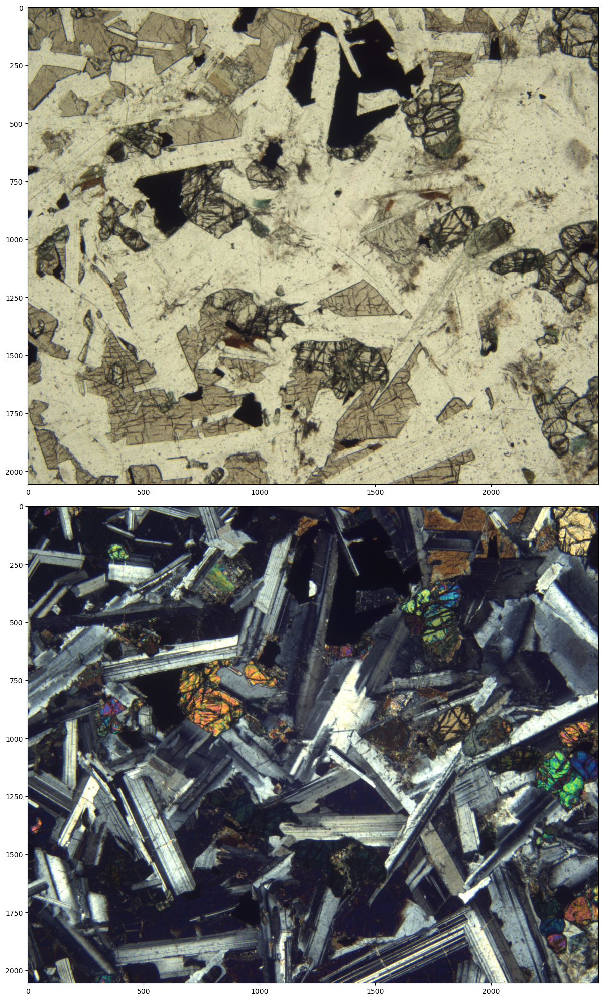

In [5]:
fig = plt.figure(figsize=(12,20))
ax_ppl = fig.add_subplot(2,1,1)
ax_ppl.imshow(image_ppl)
ax_xpl = fig.add_subplot(2,1,2)
ax_xpl.imshow(image_xpl)
fig.tight_layout()

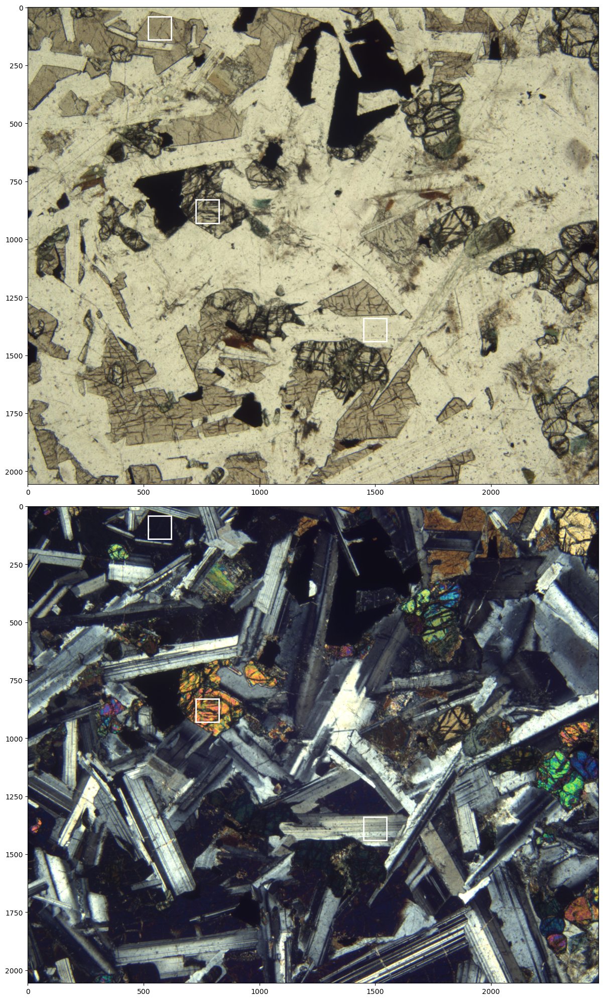

In [6]:
# Select portions of the images as training data.

from matplotlib.patches import Rectangle 

class RectangleLocation:
    def __init__(self, corners = [], width = 0, height = 0):
        self.corners = corners
        self.width = width
        self.height = height
        
    def plot_rect(self, axes):
        # plot rectangle on axes, specified singly or as a list
        if type(axes) is not list: axes = [axes]
        for ax in axes:
            ax.add_patch(Rectangle(
                self.corners, self.width, self.height,
                facecolor='None', edgecolor='w', linewidth=2))

    def flatten_data(self, band_list):
        flat_data = []
        for band in band_list:
            y_start = self.corners[0]
            y_end = self.corners[0]+int(self.width)
            x_start = self.corners[1] 
            x_end = self.corners[1]+int(self.height)
            training_image = band[x_start:x_end, y_start:y_end]
            training_data = training_image.flatten()
            flat_data.append(training_data)
        transposed_data = np.array(flat_data).transpose()
        return transposed_data
        

#cpx = RectangleLocation(corners=[400,1700], width=200, height=150)
#plag = RectangleLocation(corners=[1600, 1880], width=100, height=100)
#ol = RectangleLocation(corners=[725, 800], width=100, height=120)
cpx = RectangleLocation(corners=[520,40], width=100, height=100)
plag = RectangleLocation(corners=[1450, 1340], width=100, height=100)
ol = RectangleLocation(corners=[725, 830], width=100, height=100)

fig = plt.figure(figsize=(12,20))
ax_ppl = fig.add_subplot(2,1,1)
ax_ppl.imshow(image_ppl)
ax_xpl = fig.add_subplot(2,1,2)
ax_xpl.imshow(image_xpl)

cpx.plot_rect([ax_ppl, ax_xpl])
plag.plot_rect([ax_ppl, ax_xpl])
ol.plot_rect([ax_ppl, ax_xpl])

fig.tight_layout()


In [7]:
# assemble training data
data_bands = [reds_ppl, greens_ppl, blues_ppl, reds_xpl, greens_xpl, blues_xpl]
n_bands = len(data_bands)

training_data_cpx = cpx.flatten_data(data_bands)
training_data_plag = plag.flatten_data(data_bands)
training_data_ol = ol.flatten_data(data_bands)

training_data = np.empty((0, n_bands))

for mineral_data in [training_data_cpx, training_data_plag, training_data_ol]:
    training_data = np.append(training_data, mineral_data, axis=0)

# assemble labels
labels_cpx = np.full(len(training_data_cpx), 'cpx')
labels_plag = np.full(len(training_data_plag), 'plag')
labels_ol = np.full(len(training_data_ol), 'ol')

training_labels = np.array([])

for mineral_label in [labels_cpx, labels_plag, labels_ol]:
    training_labels = np.append(training_labels, mineral_label)



In [8]:
# classify!
from sklearn.neighbors import KNeighborsClassifier

# make a classifier object
knn = KNeighborsClassifier(n_neighbors=21)
# create a classification fit using the training data
fit = knn.fit(training_data, training_labels)

In [9]:
# assemble full image data for data_bands as columns in array

n_pixels = np.size(data_bands[0])
full_image_data = np.empty((n_pixels, len(data_bands)))

for iband, band in enumerate(data_bands):
    full_image_data[:,iband] = band.flatten()


In [10]:
# this may take a minute

prediction = fit.predict(full_image_data)

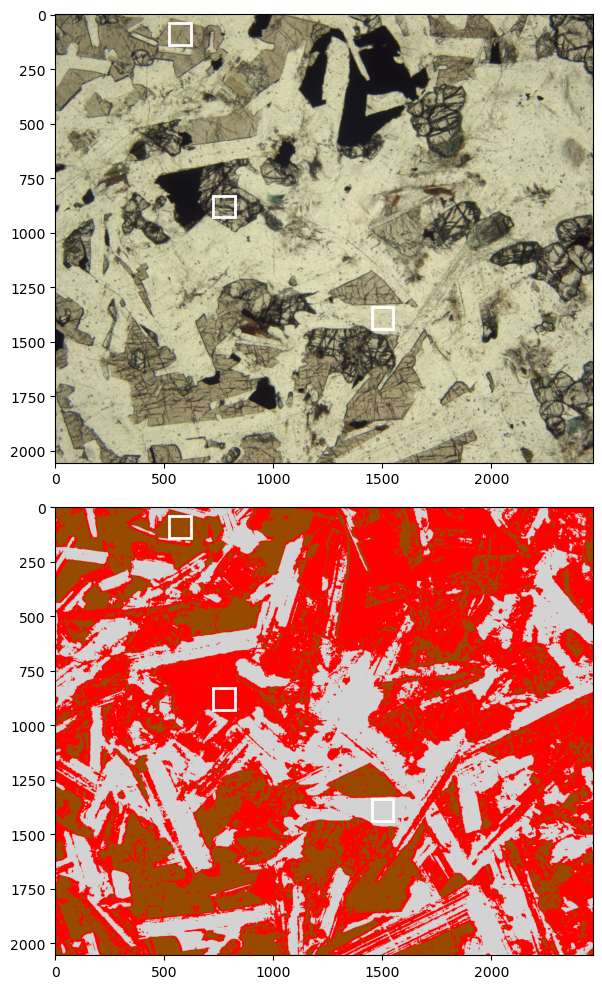

In [11]:
prediction_RGB=[]
for ipixel in prediction:
    if ipixel=='cpx':
        prediction_RGB.append([150,75,0]) # make cpx brown
    if ipixel=='plag':
        prediction_RGB.append([211,211,211]) # make plag light grey
    if ipixel=='ol':
        prediction_RGB.append([255,0,0]) # make olivine red
        
prediction_RGB=np.array(prediction_RGB)

prediction_RGB=prediction_RGB.reshape(image_ppl.shape)


fig = plt.figure(figsize=(6,10))
ax_ppl = fig.add_subplot(2,1,1)
ax_ppl.imshow(image_ppl)
ax_xpl = fig.add_subplot(2,1,2)
ax_xpl.imshow(prediction_RGB)

cpx.plot_rect([ax_ppl, ax_xpl])
plag.plot_rect([ax_ppl, ax_xpl])
ol.plot_rect([ax_ppl, ax_xpl])

fig.tight_layout()